In [2]:
%matplotlib inline

## Import libs

In [5]:
import pandas as pd
import os
import glob
import smopy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy import ndimage
from datetime import datetime
import imageio

In [6]:
INPUT_FOLDER      = './data_preprocessed4/'

list_df_metadata = []

# Find all files that ends with .csv, read and append to the list_df_metadata
for filename in glob.glob(INPUT_FOLDER + '*.csv'):
    df_data = pd.read_csv(filename, parse_dates=['datetime', 'timedelta'])
    list_df_metadata.append(df_data)
    
df = pd.concat(list_df_metadata)
df = df.drop(['Unnamed: 0'], axis=1)
df = df.reset_index(drop=True)
df.head()

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,lat,long,altitude,datetime,timedelta,distance,velocity,acceleration,trajectory_id,subfolder,...,a_ave,a_med,a_max,a_min,a_std,a_rol,a_rsd,a_qu1,a_qu2,a_qu3
0,40.061035,116.407049,64.0,2011-05-29 22:30:19,0 days 00:00:01.000000000,13.357307,13.357307,-0.810261,20110529222904,168,...,-0.029584,0.0,8.873882,-14.649245,0.731106,-0.193232,3.278783,-0.531929,0.024086,0.678226
1,40.060915,116.407060,65.0,2011-05-29 22:30:20,0 days 00:00:01.000000000,12.547046,12.547046,0.810261,20110529222904,168,...,-0.029584,0.0,8.873882,-14.649245,0.731106,-0.107458,3.269948,-0.333394,0.050601,0.784147
2,40.060802,116.407060,63.0,2011-05-29 22:30:21,0 days 00:00:01.000000000,13.357307,13.357307,-0.634696,20110529222904,168,...,-0.029584,0.0,8.873882,-14.649245,0.731106,-0.118051,3.271165,-0.531929,0.050601,0.784147
3,40.060682,116.407071,63.0,2011-05-29 22:30:22,0 days 00:00:01.000000000,12.722611,12.722611,-1.113277,20110529222904,168,...,-0.029584,0.0,8.873882,-14.649245,0.731106,-0.118465,3.271294,-0.531929,0.050601,0.784147
4,40.060568,116.407086,62.0,2011-05-29 22:30:23,0 days 00:00:01.000000000,11.609334,11.609334,-1.358473,20110529222904,168,...,-0.029584,0.0,8.873882,-14.649245,0.731106,-0.152541,3.278956,-0.618968,0.050601,0.784147


In [8]:
df.describe()

,lat,long,altitude,distance,velocity,acceleration,v_ave,v_med,v_max,v_min,...,a_ave,a_med,a_max,a_min,a_std,a_rol,a_rsd,a_qu1,a_qu2,a_qu3
count,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,...,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07,2.338093e+07
mean,3.893370e+01,1.121638e+02,5.357310e+02,4.912725e+01,1.716173e+01,-8.815809e-01,1.915032e+01,7.920806e+00,9.686946e+02,1.284557e-02,...,-1.365800e+00,-4.931875e-04,7.530892e+02,-9.031069e+02,2.854292e+01,-7.411645e-01,3.126023e+00,-2.912679e+00,-3.215356e-01,1.512474e+00
std,4.161358e+00,2.782147e+01,2.357406e+03,5.647933e+03,1.920480e+03,8.068271e+02,5.789914e+02,1.317767e+01,2.089227e+04,4.444288e-01,...,7.295201e+01,8.337819e-03,1.572725e+04,2.086580e+04,1.271061e+03,2.889274e+02,6.798207e+02,9.280171e+02,1.727417e+02,3.087861e+02
min,1.044024e+00,-1.799696e+02,-3.264760e+04,0.000000e+00,0.000000e+00,-8.618472e+05,9.467372e-02,0.000000e+00,3.954776e-01,0.000000e+00,...,-3.982492e+03,-6.351975e-01,1.983470e-02,-8.618472e+05,1.010328e-02,-2.405065e+05,0.000000e+00,-6.460548e+05,-2.486831e+05,-1.234693e+00
25%,3.990300e+01,1.163065e+02,8.900000e+01,2.668541e+00,1.014016e+00,-1.828288e-01,2.904935e+00,1.400297e+00,2.837033e+01,0.000000e+00,...,-4.104840e-02,-1.996203e-03,5.575948e+00,-3.823422e+01,5.318414e-01,-4.687639e-02,2.363296e-01,-3.397581e-01,-2.694353e-02,8.091506e-02
50%,3.997461e+01,1.163378e+02,1.509000e+02,9.395376e+00,3.883886e+00,0.000000e+00,5.415076e+00,3.481775e+00,4.901819e+01,0.000000e+00,...,-1.304721e-02,0.000000e+00,1.336529e+01,-1.709191e+01,8.454364e-01,-1.512513e-03,4.321408e-01,-1.844147e-01,-5.532029e-07,1.772792e-01
75%,3.999939e+01,1.164222e+02,2.230000e+02,1.802464e+01,1.267860e+01,1.773850e-01,1.153575e+01,1.148731e+01,8.497029e+01,0.000000e+00,...,-5.448752e-04,3.870692e-05,2.680108e+01,-6.947022e+00,1.420615e+00,2.236289e-02,6.911517e-01,-8.005690e-02,2.531518e-02,3.243266e-01
max,6.475199e+01,1.799969e+02,1.075033e+05,7.965545e+06,8.618735e+05,3.237635e+05,3.161095e+04,2.455665e+02,8.618735e+05,5.898802e+01,...,6.758354e+00,6.057686e-01,4.260505e+05,3.764950e-02,6.920019e+04,1.074601e+04,4.067903e+05,1.935874e+00,4.755723e+04,1.615351e+05


In [9]:
df.shape

(23380929, 31)

In [10]:
print(df.head())

         lat        long  altitude            datetime  \
0  40.061035  116.407049      64.0 2011-05-29 22:30:19   
1  40.060915  116.407060      65.0 2011-05-29 22:30:20   
2  40.060802  116.407060      63.0 2011-05-29 22:30:21   
3  40.060682  116.407071      63.0 2011-05-29 22:30:22   
4  40.060568  116.407086      62.0 2011-05-29 22:30:23   

                   timedelta   distance   velocity  acceleration  \
0  0 days 00:00:01.000000000  13.357307  13.357307     -0.810261   
1  0 days 00:00:01.000000000  12.547046  12.547046      0.810261   
2  0 days 00:00:01.000000000  13.357307  13.357307     -0.634696   
3  0 days 00:00:01.000000000  12.722611  12.722611     -1.113277   
4  0 days 00:00:01.000000000  11.609334  11.609334     -1.358473   

    trajectory_id subfolder    ...        a_ave  a_med     a_max      a_min  \
0  20110529222904       168    ...    -0.029584    0.0  8.873882 -14.649245   
1  20110529222904       168    ...    -0.029584    0.0  8.873882 -14.649245   
2  20

## Coordinates plotting

In [12]:
smopy.TILE_SERVER = "http://tile.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png"
smopy.TILE_SIZE = 256

In [13]:
latMin = min(df.lat)
latMax = max(df.lat)
longMin = min(df.long)
longMax = max(df.long)

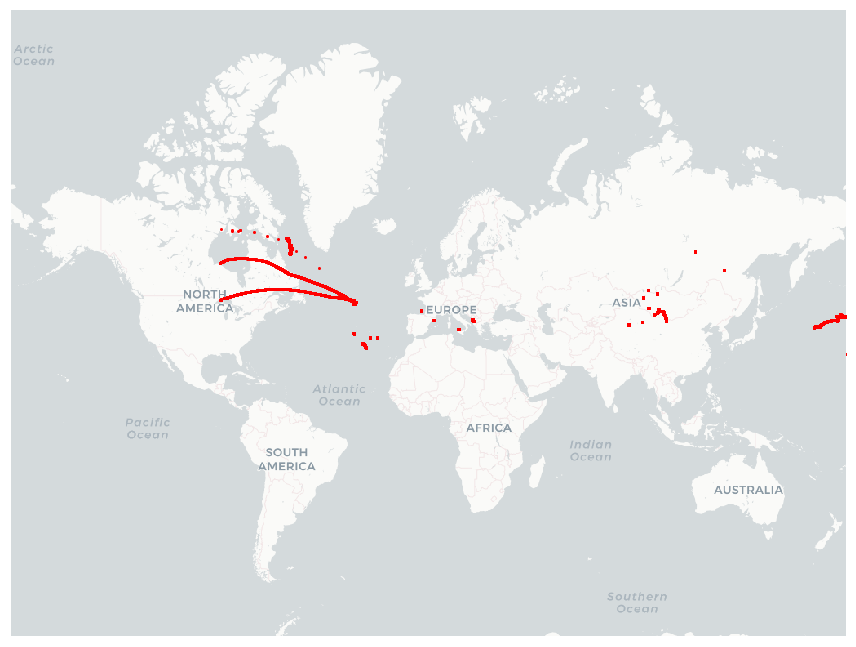

In [14]:
mapAll = smopy.Map((latMin, longMin, latMax, longMax ), z=2)
x, y = mapAll.to_pixels(df.lat, df.long)
ax = mapAll.show_mpl(figsize=(12, 10))
ax.plot(x, y, 'or', ms=2)

## Beijing

In [16]:
latMinB = 39.64
latMaxB = 40.51
longMinB = 115.76
longMaxB = 116.88

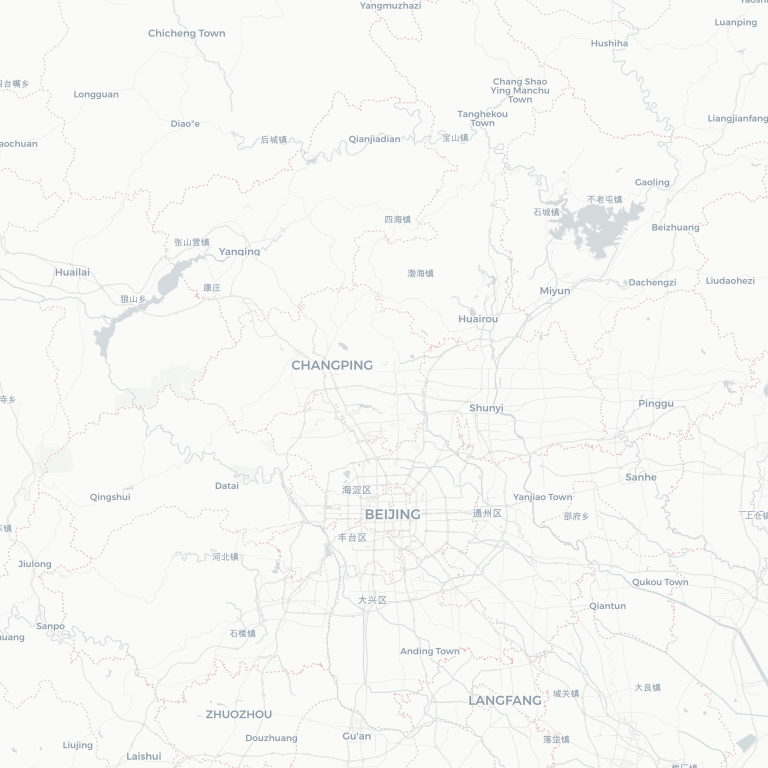

In [17]:
mapBeijing = smopy.Map((latMinB, longMinB, latMaxB, longMaxB ), z=9)
mapBeijing.show_ipython()

## Let's build a heatmap to check out the busy areas

In [18]:
df['xPixel'] = mapBeijing.to_pixels(df.lat, df.long)[0]
df['yPixel'] = mapBeijing.to_pixels(df.lat, df.long)[1]

In [19]:
# Filter data points
dfBeijing = df[(df.lat.between(latMinB, latMaxB)) & (df.long.between(longMinB, longMaxB))]

In [20]:
cmap = LinearSegmentedColormap.from_list('mycmap', [(0, (1,0,0,0)), (0.5, (1,0.5,0,0.8)), (0.75, (1,1,0,0.8)), (0.875, (1,1,1,1)), (1, (1,1,1,1))])

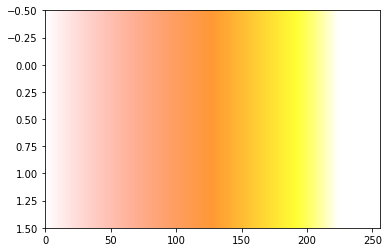

In [21]:
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
fig, ax = plt.subplots()
ax.imshow(gradient, aspect='auto', cmap=cmap)

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log
  if sys.path[0] == '':


10.840271620104982

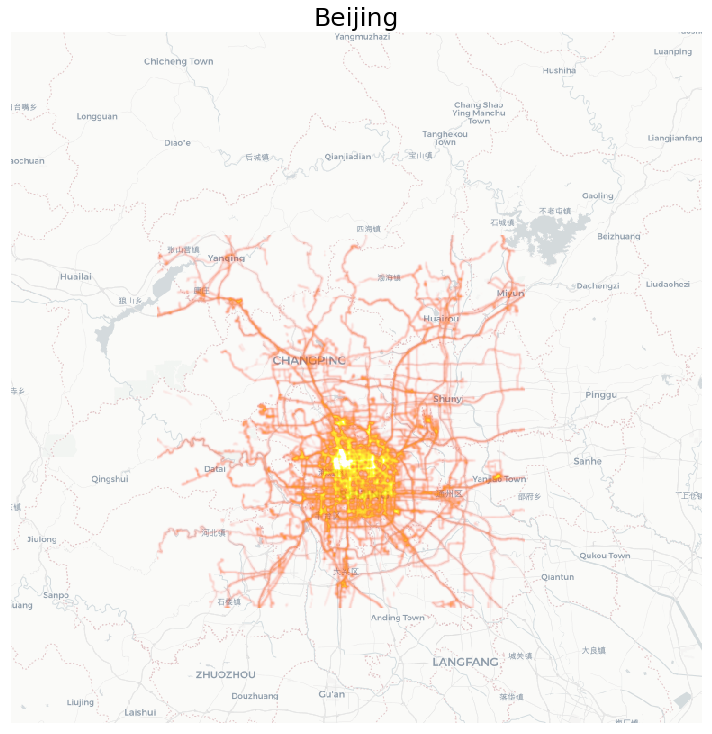

In [22]:
ax = mapBeijing.show_mpl(figsize=(12, 10))
bins=400
smoothing =1.

title = 'Beijing'

x = list(dfBeijing['xPixel'])
y = list(dfBeijing['yPixel'])
heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
logheatmap = np.log(heatmap)
logheatmap[np.isneginf(logheatmap)] = 0
logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')

ax.set_title(title, size=25)

plt.savefig(title+'.png', bbox_inches='tight')
    
ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=10)

plt.savefig(title+'.png', bbox_inches='tight')

np.amax(logheatmap)

## Now that we figured out how to make a heatmap, let's put it into a function and zoom into the central area

In [23]:
def heatMap(long, lat, area, bins=200, smoothing=1, vmax=4, title=None):
    x = area.to_pixels(lat, long)[0]
    y = area.to_pixels(lat, long)[1]
    
    ax = area.show_mpl(figsize=(12, 10))
    
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    output = ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=vmax)
    
    if title:
        ax.set_title(title, size=25)
        plt.savefig(title+'.png', bbox_inches='tight')
    
    print(np.amax(logheatmap))
    return output

In [24]:
latMin = 39.8
latMax = 40
longMin = 116.2
longMax = 116.4

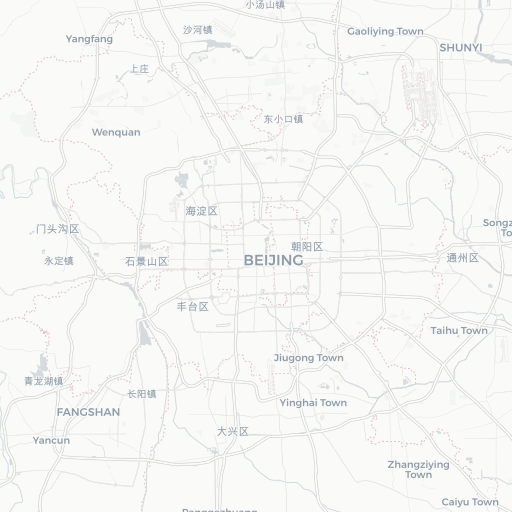

In [25]:
mapZoom = smopy.Map((latMin, longMin, latMax, longMax ), z=10)
mapZoom.show_ipython()

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


10.277193996835619


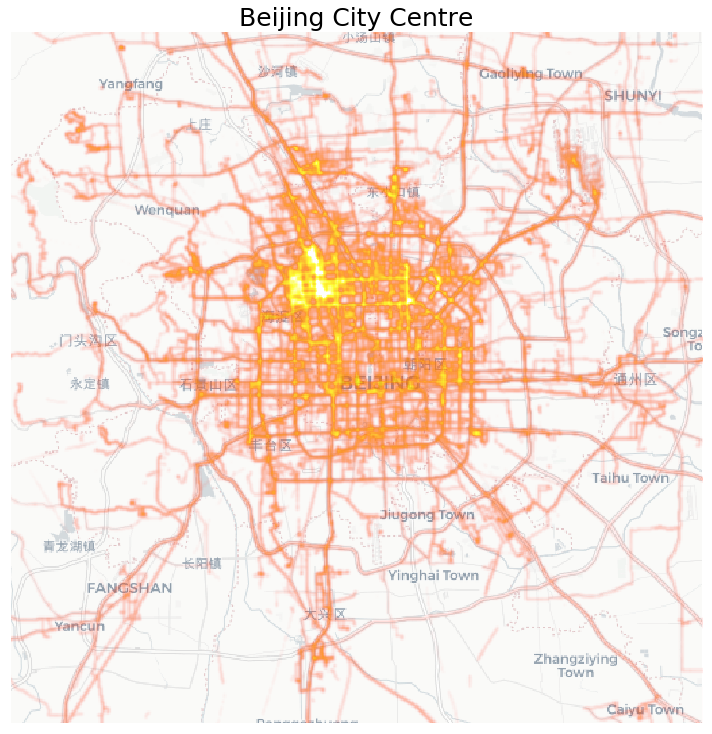

In [26]:
heatMap(dfBeijing.long, dfBeijing.lat, mapZoom, bins=800, vmax=10, title='Beijing City Centre')

In [27]:
len(df.trajectory_id.unique())

16644

In [28]:
df.set_index('datetime', inplace=True)

CPU times: user 24.4 s, sys: 1min 31s, total: 1min 56s
Wall time: 1min 55s


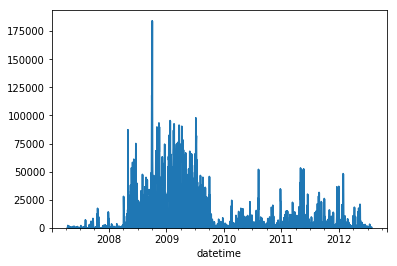

In [29]:
%time df.resample('D').count().lat.plot(kind='area')

## Check out the count of the labels

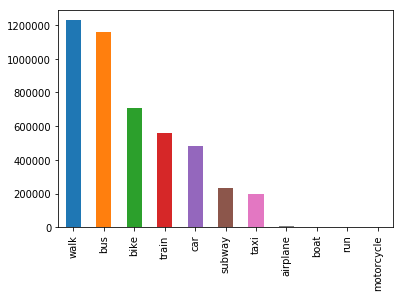

In [30]:
df['labels'].value_counts().plot(kind='bar')

## Find the busiest roads

In [31]:
dfRoads = dfBeijing[dfBeijing['labels'].isin(['car', 'bus', 'taxi'])]

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


7.291864107359262


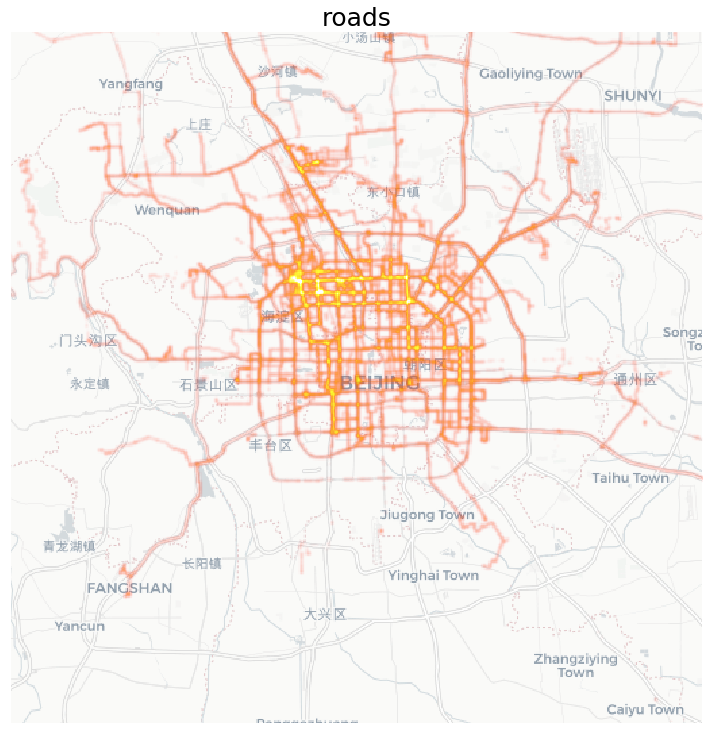

In [32]:
heatMap(dfRoads.long, dfRoads.lat, mapZoom, bins=800, vmax=7, title='roads')

## Where are the walking areas?

In [33]:
dfWalking = dfBeijing[dfBeijing['labels'] == 'walk']

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


8.25180037436648


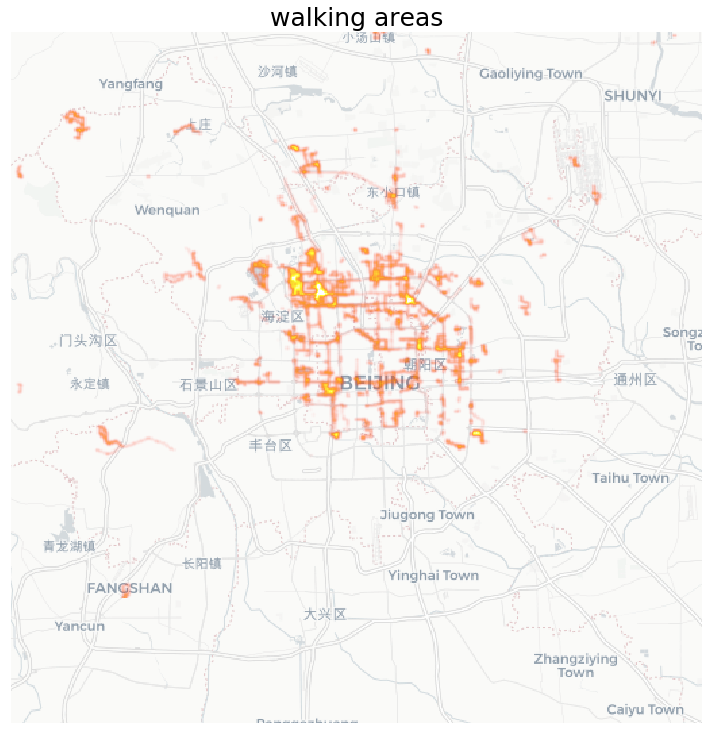

In [34]:
heatMap(dfWalking.long, dfWalking.lat, mapZoom, bins=800, vmax=8, title='walking areas')

## Can we spot the bus lines?

In [35]:
dfBus = dfBeijing[dfBeijing['labels'] == 'bus']

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


6.545316810148654


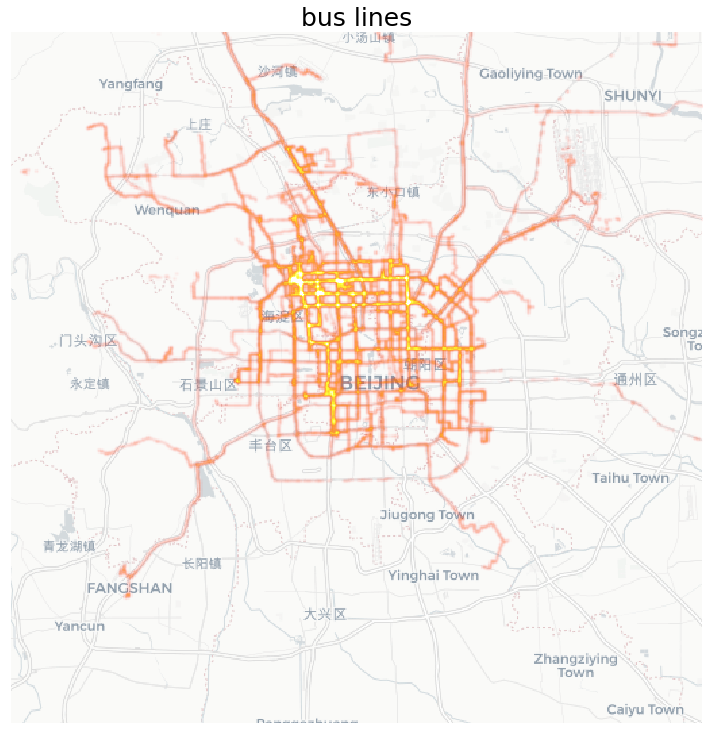

In [36]:
heatMap(dfBus.long, dfBus.lat, mapZoom, bins=800, vmax=6, title='bus lines')

## Is there a difference during the day?

In [37]:
def getTime(x):
    return datetime.strptime(str(x), '%H').strftime('%Hh%M')

/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


7.397746930935413
7.90511708918444
7.754519717826206
7.0009365840929805
7.093824832410412
7.098329732580654
7.136192813805181
7.083304328648241
7.214412289998562
7.099478229961445
7.261925417558363
7.242969560941177
7.13018257262155
7.3059115419265925
7.356571615504265
7.040188340527601
6.564093851747447
6.2335222688615755
5.881969827698722
5.232481478731188


/home/zh.shakenov/miniconda3/envs/disser/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


5.3889161101525325
5.752764277150728
6.02657789711345
6.373806776540127


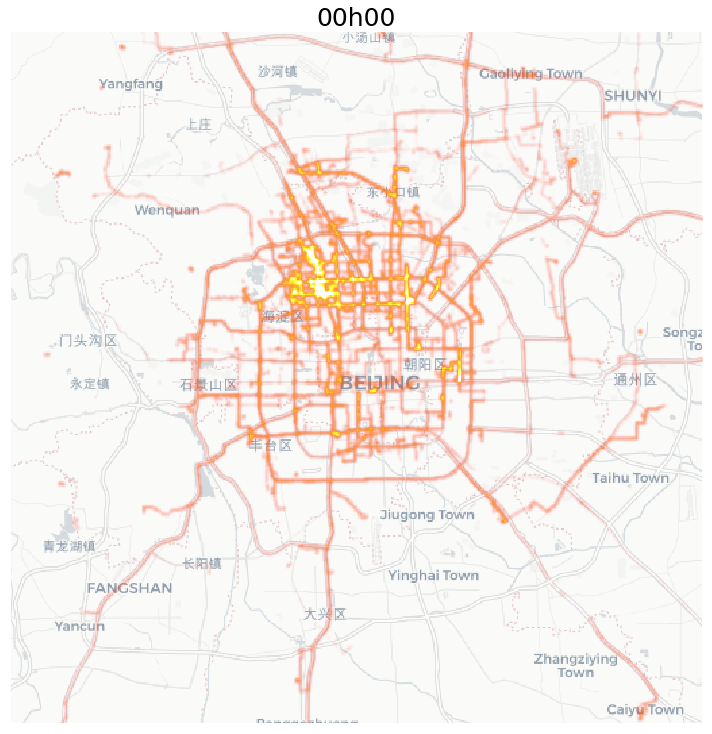

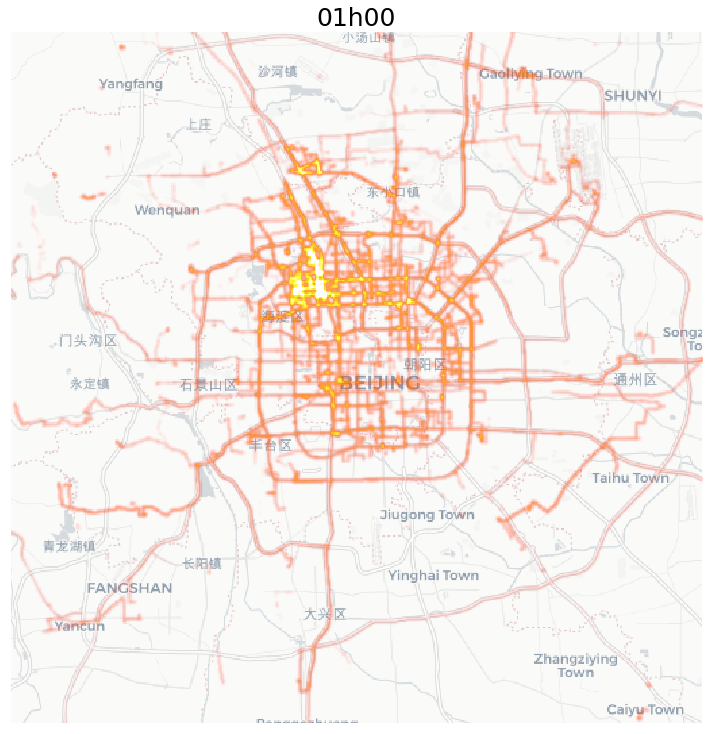

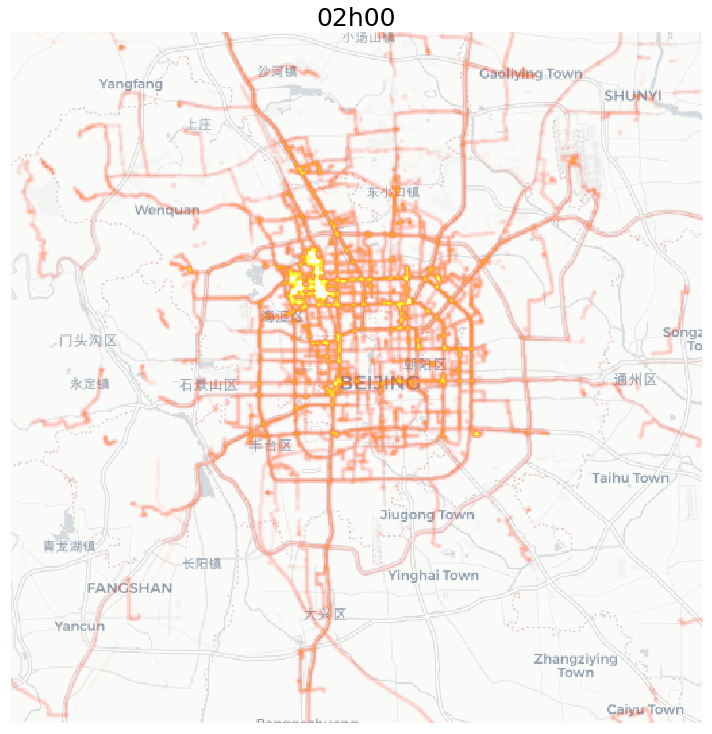

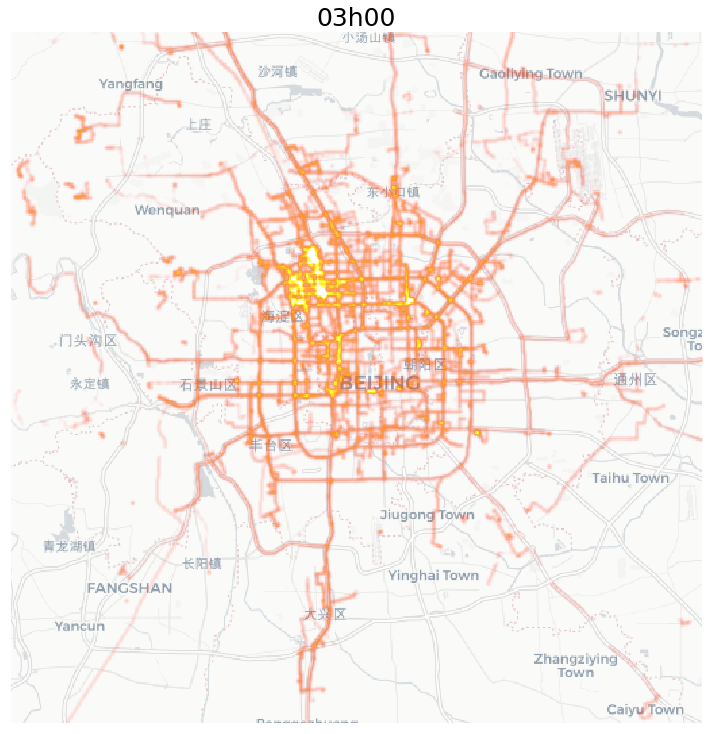

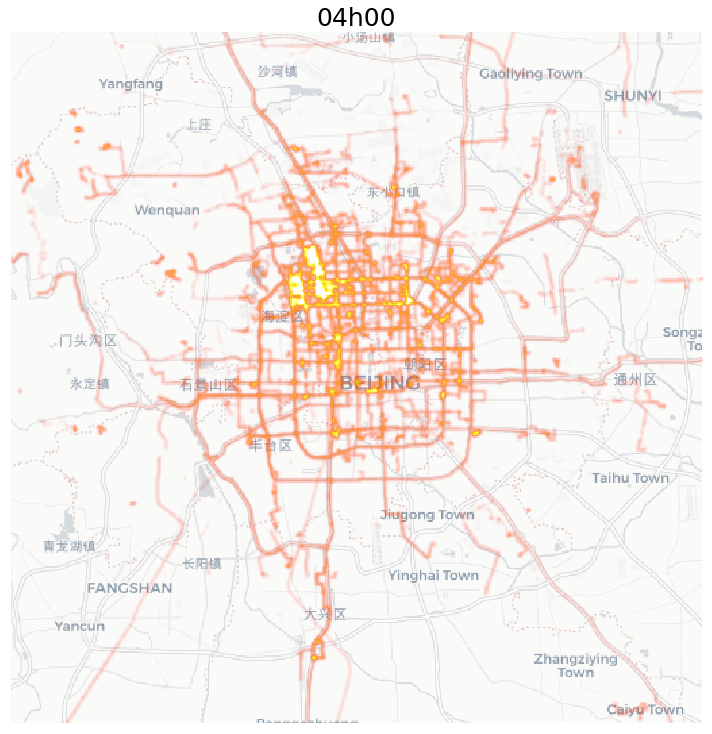

...

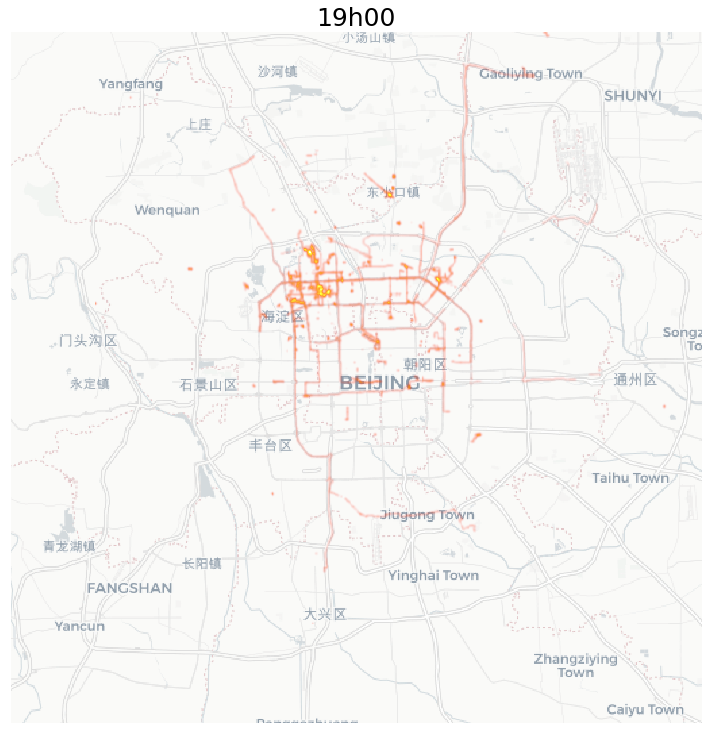

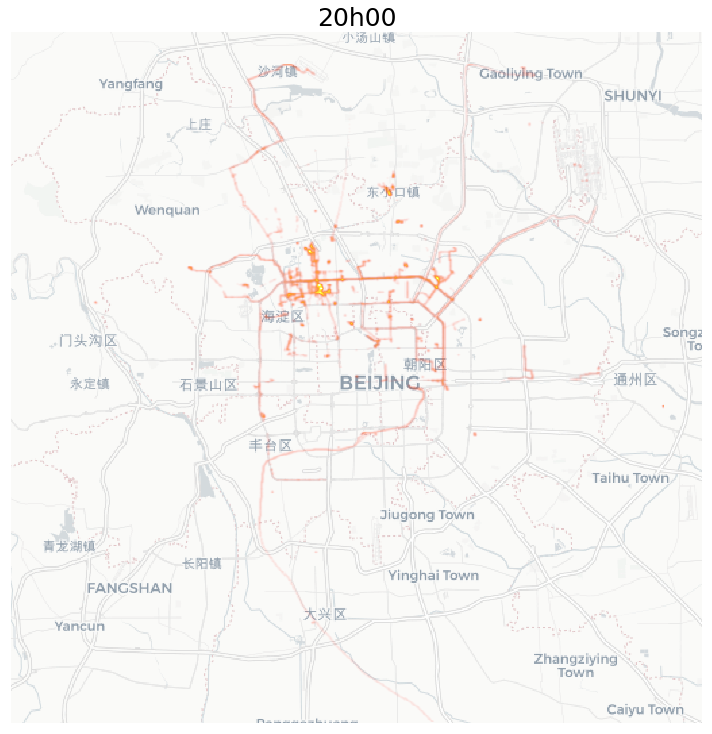

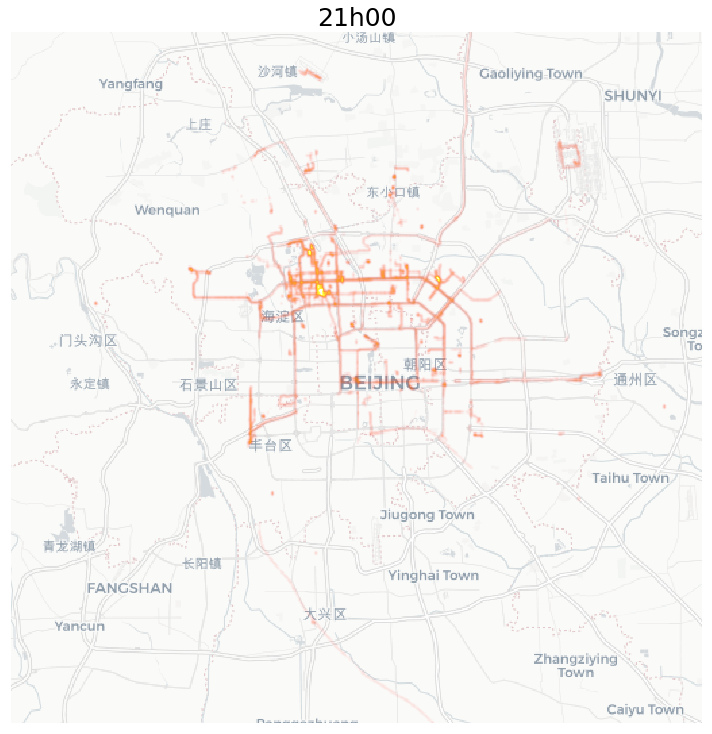

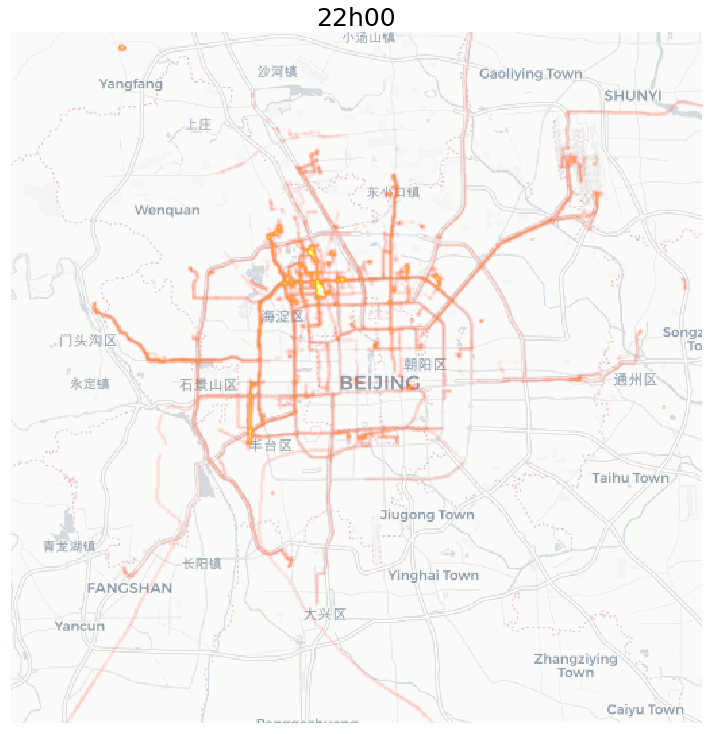

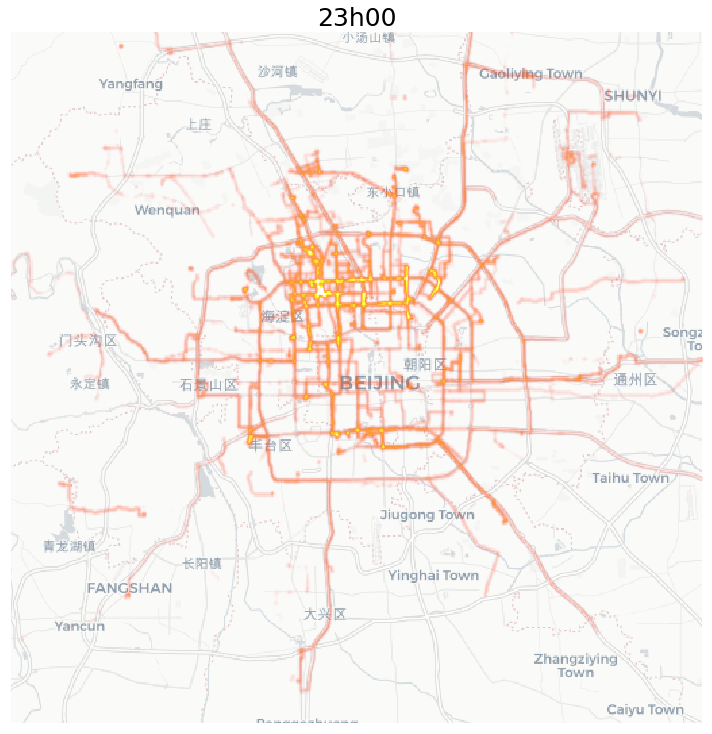

In [38]:
for i in range(24):
    dfHour = dfBeijing[dfBeijing['datetime'].dt.hour == i]
    heatMap(dfHour.long, dfHour.lat, mapZoom, bins=800, vmax=6, title=getTime(i))

In [39]:
%ls

00h00.png  10h00.png  20h00.png                         data/
01h00.png  11h00.png  21h00.png                         DataPreparation.py
02h00.png  12h00.png  22h00.png                         data_preprocessed/
03h00.png  13h00.png  23h00.png                         data_preprocessed2/
04h00.png  14h00.png  6. Advanced Loading.py            data_preprocessed3/
05h00.png  15h00.png  8. Mode Classify.py               data_preprocessed4/
06h00.png  16h00.png  9. Cool animation - server.ipynb  data.zip
07h00.png  17h00.png  Beijing City Centre.png           res.out
08h00.png  18h00.png  Beijing.png                       roads.png
09h00.png  19h00.png  bus lines.png                     walking areas.png


In [40]:
files = glob.glob('*h00.png')
images = []
for file in files:
    images.append(imageio.imread(file))
imageio.mimsave('24hBeijing.gif', images)

In [42]:
files = glob.glob('*h00.png')
images = []

for file in files:
    images.append(imageio.imread(file))

kargs = { 'duration': 0.5 }
imageio.mimsave('24hBeijing-delay.gif', images, 'GIF', **kargs)

In [45]:
files = sorted(glob.glob('*h00.png'))
images = []
for file in files:
    images.append(imageio.imread(file))

kargs = { 'duration': 0.5 }
imageio.mimsave('24hBeijing-delay-ordered.gif', images, 'GIF', **kargs)